## Network Analytics¶
Community detection of two networks using Pythons NetworkX by Jaume Clave  
March 23rd, 2020

### Community Detection
Commuinity detection is an important area in the study of social networks. A network is said to have community structure or community if the nodes of the network can be easily grouped into sets of nodes such that each set of nodes is densely connected internally. The densely connected areas of the network can provide great information into how the network is divided, provide understanding into powerful and influential members and it can allow the researcher to see how the network develops over times. Similarly it allows us to create a large scale map of a network since individual communities act like meta-nodes in the network which makes its study easier. Most real networks have communities and the existence of communites generally affects various processes like rumour spreading or epidemic spreading happening on a network. Hence to properly understand such processes, it is important to detect communities and also to study how they affect the spreading processes in various settings.

### Index
[Community Detection](#Community-Detection)

[Zachary's Karate Club](#Zachary's-Karate-Club-Community-Detection-Network-Analysis)  
i. [Girvan–Newman](#ZKC:-Girvan–Newman)  
ii. [Louvain Modularity](#ZKC:-Louvain-Modularity)  

[Whom-Talks-to-Whom](#Who-Talk-to-Whom-Community-Detection-Network-Analysis)  
i. [Girvan–Newman](#WTTW:-Girvan–Newman)  
ii. [Louvain Modularity](#WTTW:-Louvain-Modularity)  

[Conclusion](#Conclusion)  
[Further Reading](#Further-Reading)

### Zachary's Karate Club Community Detection Network Analysis

This report aims to provide information into the network structure and organization of a karate class owned by someone named Zachary. The data provided comes from a file provided by Imperial College London. 

The objective is to identify who the leaders and opinion-makers in the club are and detect communities of people in the club.

The report includes the complete process needed in analysing such a network. First, packages required for data manipulation and analysis will be imported. Data will be pre-processed and cleaned in order to facilitate the investigation. Following that, centrality measures will be examined to provide direct information about club memebers (nodes) that are important in the cohort. The network will be visualised in various ways to allow the reader to gain visual interpretability of the network. Finally, communitiy detection algorithms, the Girvan-Newman algorithm and the Louvain method will be utilised. This will provide information about the communities in these networks and finally these will be displayed visually, each communitiy in a different color, so as to provide the reader with a clear visual representation of what the communitiy detection algorithms have found.

In [1]:
import pandas as pd
import numpy as np
import networkx as nx 
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
## Zachs karate club
## Import data file
placeholder = r'C:\Users\Jaume\Documents\ICBS - MSc Business Analytics\Network Analytics\Homework 3'

karate = 'zachary_karate_club.txt'

In [3]:
df = pd.read_csv(r'C:\Users\Jaume\Documents\ICBS - MSc Business Analytics\Network Analytics\Homework 3\zachary_karate_club.txt', sep = ' ', header = None)
df.columns = ['person_1', 'person_2']

Name: 
Type: Graph
Number of nodes: 34
Number of edges: 78
Average degree:   4.5882


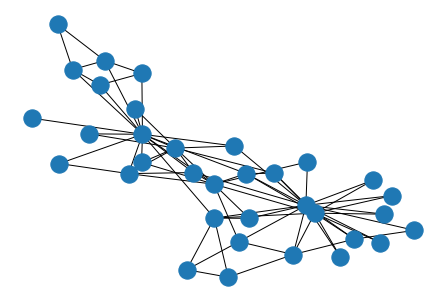

In [4]:
## Edge list and adjacency matrix
G = nx.read_edgelist(
    r'C:\Users\Jaume\Documents\ICBS - MSc Business Analytics\Network Analytics\Homework 3\zachary_karate_club.txt')

## Quick plot
nx.draw(G)
print(nx.info(G))

In [5]:
## Adjacency matrix
a_matrix = nx.adjacency_matrix(G)

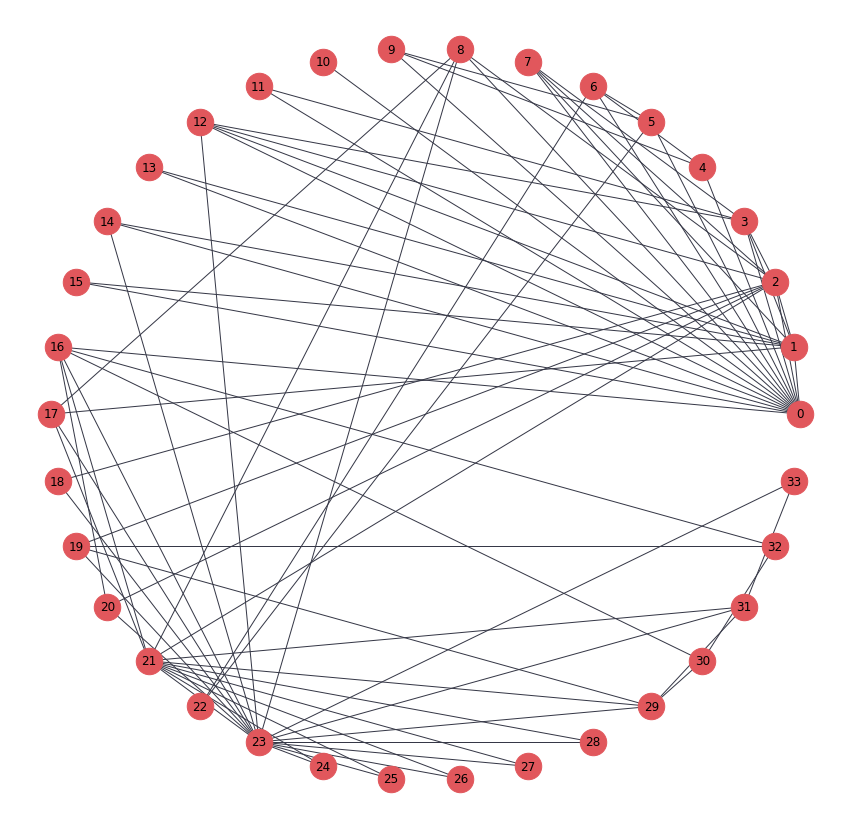

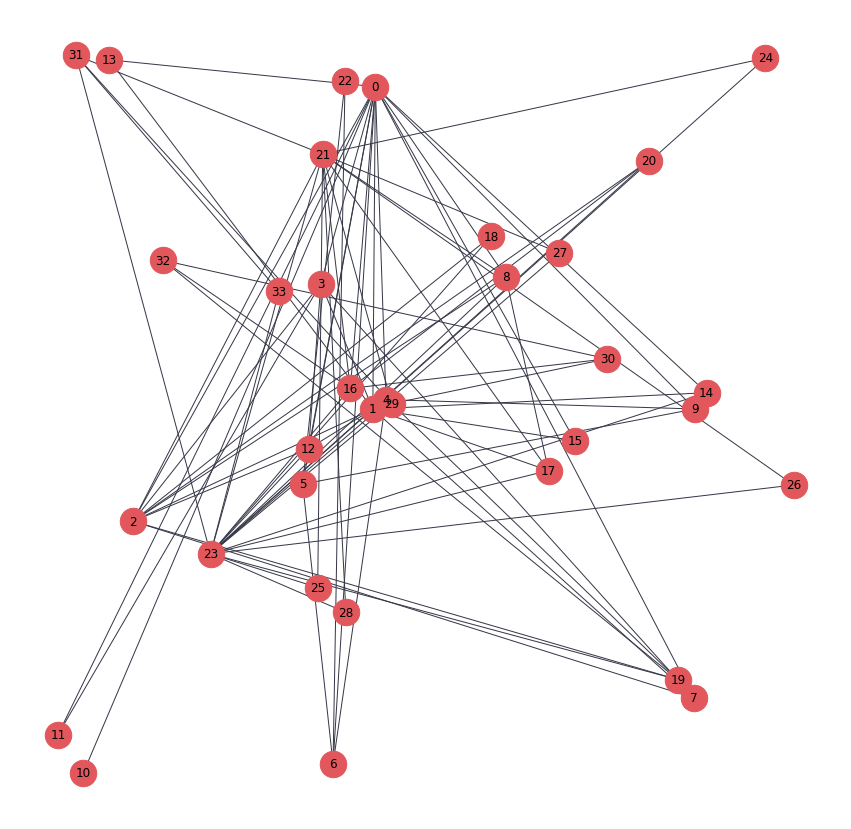

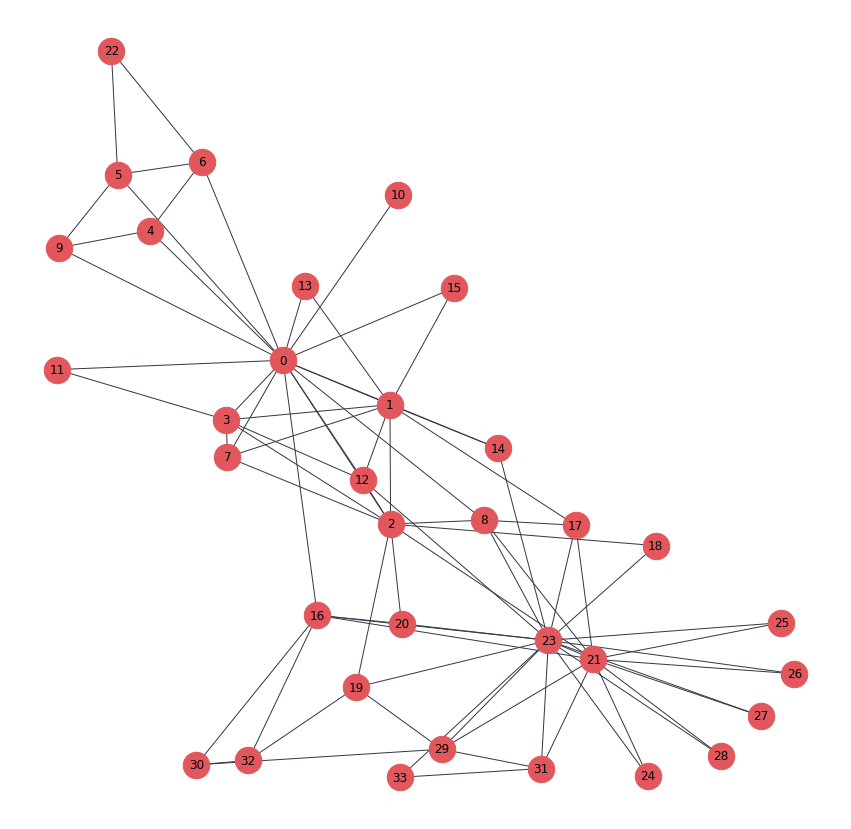

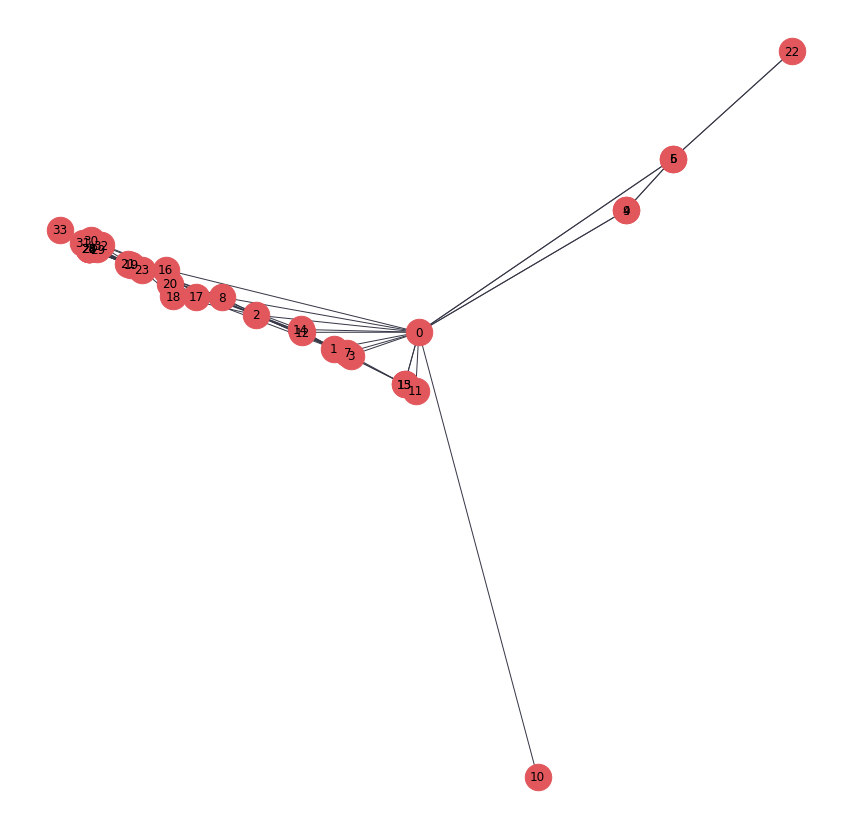

In [6]:
## Imporving the graph by trying out different layouts
graph_layouts = [nx.circular_layout(G), nx.random_layout(G), nx.spring_layout(G), nx.spectral_layout(G)]

for graph in graph_layouts:
        plt.subplots(figsize=(15, 15))
        nx.draw(G, with_labels = True, node_size = 700, node_color = "#e1575c", edge_color = '#363847',  pos = graph)
        plt.show()

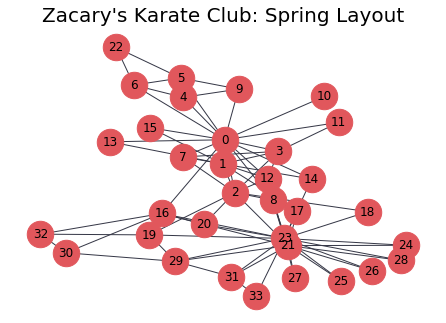

In [7]:
## Best visualisation
nx.draw(G, with_labels = True, node_size = 700, node_color = "#e1575c", edge_color = '#363847',  pos = nx.spring_layout(G))
plt.title("Zacary's Karate Club: Spring Layout", fontsize=20)
plt.axis('off')
plt.show()

In [8]:
## Computing weighted eigenvector centrality
centrality_nx = nx.eigenvector_centrality(G)
l_eigen_cent = list(centrality_nx.values())

## Finding the student node in graph who has the largest cenrtality value (most emails sent)
(largest_hub, degree) = sorted(centrality_nx, key = centrality_nx.get, reverse = True)[:2]
print(largest_hub)

df_eig_cent = pd.DataFrame(centrality_nx.items(), columns = ['person', 'degree_centrality'])
df_eig_cent.sort_values('degree_centrality', ascending = False).head()

23


,person,degree_centrality
23,23,0.373371
0,0,0.355483
2,2,0.317189
21,21,0.308651
1,1,0.265954


In [9]:
## Degree Centrality
## The function degree_centrality(G) is available in networkx.algorithms.centrality
deg_cent = nx.algorithms.centrality.degree_centrality(G)
l_deg_cent = list(deg_cent.values())

## The output is dictionary of nodes with degree centrality as the value
print("Degree centrality:")
#print(deg_cent)

df_deg_cent = pd.DataFrame(deg_cent.items(), columns = ['person', 'degree_centrality'])
df_deg_cent.sort_values('degree_centrality', ascending = False).head()

Degree centrality:


,person,degree_centrality
23,23,0.515152
0,0,0.484848
21,21,0.363636
2,2,0.303030
1,1,0.272727


In [10]:
## The function betweenness_centrality(G) is also available in networkx.algorithms.centrality
bet_cent = nx.algorithms.centrality.betweenness_centrality(G)
l_bet_cent = list(bet_cent.values())

print("Betweenness centrality:")
#print(bet_cent)

df_bet_cent = pd.DataFrame(bet_cent.items(), columns = ['person', 'betweeness_centrality'])
df_bet_cent.sort_values('betweeness_centrality', ascending = False).head()

Betweenness centrality:


,person,betweeness_centrality
0,0,0.437635
23,23,0.304075
21,21,0.145247
2,2,0.143657
16,16,0.138276


In [11]:
## The function betweenness_centrality(G) is also available in networkx.algorithms.centrality
clo_cent = nx.algorithms.centrality.closeness_centrality(G)
l_clo_cent = list(clo_cent.values())

print("Closeness centrality:")
#print(clo_cent)

df_clo_cent = pd.DataFrame(clo_cent.items(), columns = ['person', 'closeness_centrality'])
df_clo_cent.sort_values('closeness_centrality', ascending = False).head()

Closeness centrality:


,person,closeness_centrality
0,0,0.568966
2,2,0.559322
23,23,0.550000
16,16,0.540984
12,12,0.515625


Text(0.5, 1.0, 'Betweenness Centrality')

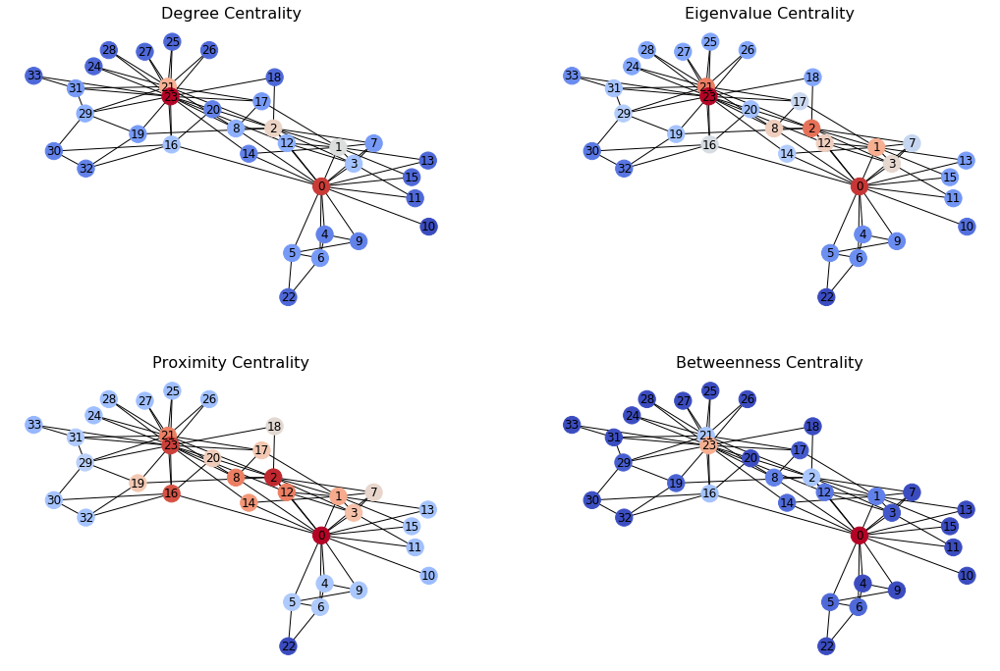

In [12]:
pos = nx.spring_layout(G)

## Plotting all centrality measures 
# Plot the centrality of the nodes
plt.figure(figsize = (18, 12))
# Degree Centrality
f, axarr = plt.subplots(2, 2, num = 1)
plt.sca(axarr[0, 0])
nx.draw(G, cmap = plt.get_cmap('coolwarm'), node_color = l_deg_cent, node_size = 300, pos = pos, with_labels=True)
axarr[0,0].set_title('Degree Centrality', size = 16)
# Eigenvalue Centrality
plt.sca(axarr[0,1])
nx.draw(G, cmap = plt.get_cmap('coolwarm'), node_color = l_eigen_cent, node_size=300, pos=pos, with_labels=True)
axarr[0,1].set_title('Eigenvalue Centrality', size=16)
# Proximity Centrality
plt.sca(axarr[1,0])
nx.draw(G, cmap = plt.get_cmap('coolwarm'), node_color = l_clo_cent, node_size=300, pos=pos, with_labels=True)
axarr[1,0].set_title('Proximity Centrality', size=16)
# Betweenness Centrality
plt.sca(axarr[1,1])
nx.draw(G, cmap = plt.get_cmap('coolwarm'), node_color = l_bet_cent, node_size=300, pos=pos, with_labels=True)
axarr[1,1].set_title('Betweenness Centrality', size=16)

### ZKC: Girvan–Newman
The Girvan–Newman algorithm detects communities by progressively removing edges from the original network. The connected components of the remaining network are the communities. Instead of trying to construct a measure that tells us which edges are the most central to communities, the Girvan–Newman algorithm focuses on edges that are most likely "between" communities.

In [13]:
## Community detection: communities in a graph using the Girvan–Newman method
import itertools
from networkx.algorithms import community
communities_generator = community.girvan_newman(G)

communities = next(communities_generator)
print(f'Using the Girvan-Method, the graph is split up into {len(communities)} communities')

Using the Girvan-Method, the graph is split up into 2 communities


In [14]:
## Creating set_node_community function
def set_node_community(G, communities):
        '''Add community to node attributes'''
        for c, v_c in enumerate(communities):
            for v in v_c:
                # Add 1 to save 0 for external edges
                G.nodes[v]['community'] = c + 1

def set_edge_community(G):
        '''Find internal edges and add their community to their attributes'''
        for v, w, in G.edges:
            if G.nodes[v]['community'] == G.nodes[w]['community']:
                # Internal edge, mark with community
                G.edges[v, w]['community'] = G.nodes[v]['community']
            else:
                # External edge, mark as 0
                G.edges[v, w]['community'] = 0

def get_color(i, r_off=1, g_off=1, b_off=1):
        '''Assign a color to a vertex.'''
        r0, g0, b0 = 0, 0, 0
        n = 16
        low, high = 0.1, 0.9
        span = high - low
        r = low + span * (((i + r_off) * 12) % n) / (n - 1)
        g = low + span * (((i + g_off) * 8) % n) / (n - 1)
        b = low + span * (((i + b_off) * 14) % n) / (n - 1)
        return (r, g, b)  

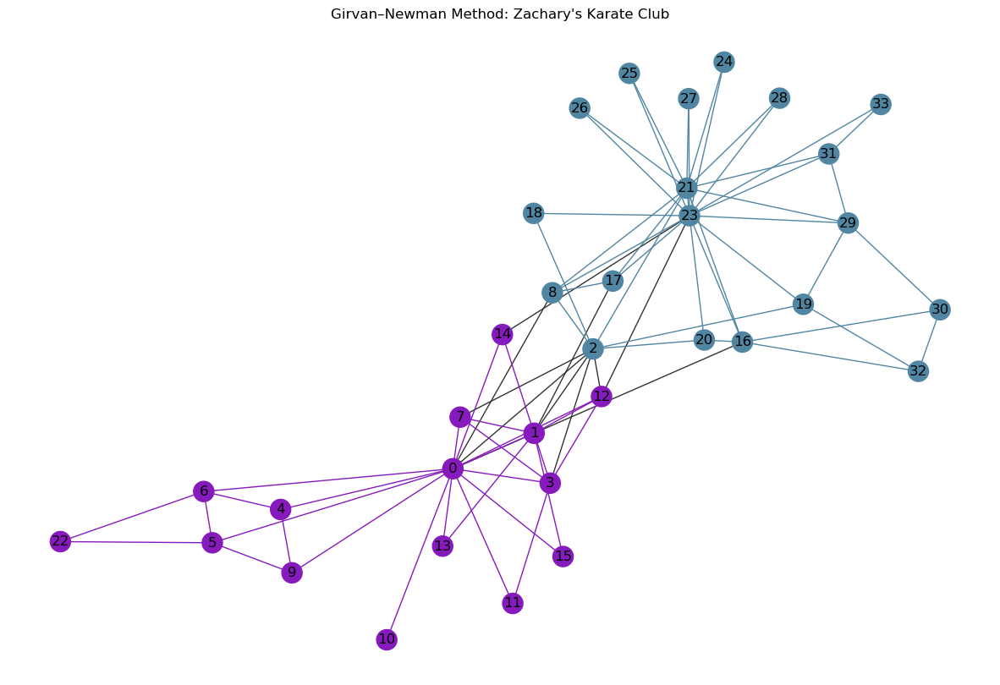

In [15]:
## Plotting 2 communities determined by the Girvan-Newman method
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams.update({'figure.figsize': (15, 10)})
# Set node and edge communities
set_node_community(G, communities)
set_edge_community(G)

# Set community color for nodes
node_color = [get_color(G.nodes[v]['community']) for v in G.nodes]

# Set community color for internal edges
external = [(v, w) for v, w in G.edges if G.edges[v, w]['community'] == 0]
internal = [(v, w) for v, w in G.edges if G.edges[v, w]['community'] > 0]
internal_color = [get_color(G.edges[e]['community']) for e in internal]

karate_pos = nx.spring_layout(G)

plt.axis('off')
plt.title('Girvan–Newman Method: Zachary\'s Karate Club')
# Draw external edges
nx.draw_networkx(
    G, pos=karate_pos, node_size=0,
    edgelist=external, edge_color="#333333", with_labels=False)
# Draw nodes and internal edges
nx.draw_networkx(
    G, pos=karate_pos, node_color=node_color,
    edgelist=internal, edge_color=internal_color)

### ZKC: Louvain Modularity
The inspiration for this method of community detection is the optimization of modularity as the algorithm progresses. Modularity is a scale value between -1 and 1 that measures the density of edges inside communities to edges outside communities (how well groups have been partitioned into clusters). Optimizing this value theoretically results in the best possible grouping of the nodes of a given network, however going through all possible iterations of the nodes into groups is impractical so heuristic algorithms are used.

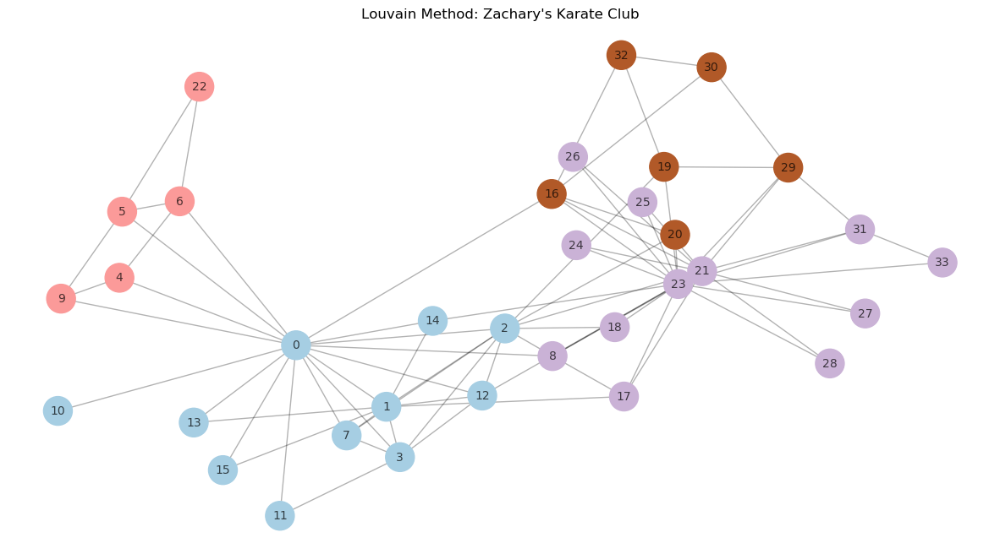

In [16]:
## Compute the first partition using Louvain modularity through the commuity package
from community import community_louvain
partition = community_louvain.best_partition(G)

## Create graph based on partition
pos = nx.spring_layout(G)
plt.figure(figsize = (15, 8))
plt.axis('off')
plt.title('Louvain Method: Zachary\'s Karate Club')
nx.draw_networkx_nodes(G, pos, with_label = True, node_size = 600, cmap = plt.cm.Paired, node_color = list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha = 0.3, with_labels = False)
nx.draw_networkx_labels(G, pos, alpha = 0.7, font_size = 10)
plt.show(G)

In [17]:
## Modularity of graph
mod = community_louvain.modularity(partition ,G)
print("modularity:", mod)

modularity: 0.41978961209730437


### Who Talk to Whom Community Detection Network Analysis
This report aims to provide information into the network structure and organization of a cohort from Imperial College London. The data provided comes from the count of the emails between the students. 

The objective is to identify the leaders and opinion-makers in the cohort are and detect communities of people in the club.

The report includes the complete process needed in analysing such a network. First, packages required for data manipulation and analysis will be imported. Data will be pre-processed and cleaned in order to facilitate the investigation. Following that, centrality measures will be examined to provide direct information about students (nodes) that are important in the cohort. The network will be visualised in various ways to allow the reader to gain visual interpretability of the network. Finally, communitiy detection algorithms, the Girvan-Newman algorithm and the Louvain method will be utilised. This will provide information about the communities in these networks and finally these will be displayed visually, each communitiy in a different color, so as to provide the reader with a clear visual representation of what the communitiy detection algorithms have found.


In [37]:
## Create function to import and clean excel sheet with the network data 
def import_clean(file, sheet, cols):
    sheet_df = pd.read_excel(file, sheet_name = sheet, usecols = cols)
    sheet_df = sheet_df.fillna(0)
    sheet_df = sheet_df.replace('-', 0.0)
    sheet_df = sheet_df.set_index('Nodes')
    return sheet_df

In [40]:
## Call function on both Sent and Recieved sheet
senders = import_clean(
    r'C:\Users\Jaume\Documents\ICBS - MSc Business Analytics\Network Analytics\Homework 2\HW2_who_talks_to_whom.xlsx',
'Sent', 'A:CD')

recievers = import_clean(r'C:\Users\Jaume\Documents\ICBS - MSc Business Analytics\Network Analytics\Homework 2\HW2_who_talks_to_whom.xlsx',
'Received', 'A:CD')

In [41]:
## Use numpy.maximum to compare two arrays and returns a new array containing the element-wise maxima
emails = np.maximum(senders, recievers)
emails.head(5)

,1,2,3,4,5,6,7,8,9,10,...,72,73,74,75,76,77,78,79,80,81
Nodes,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,5.0,1.0,1.0,5.0,2.0
2,2.0,0.0,0.0,1.0,3.0,0.0,5.0,0.0,0.0,0.0,...,0.0,2.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,1.0,0.0,2.0,0.0,0.0,7.0,0.0,...,5.0,0.0,0.0,0.0,3.0,0.0,11.0,2.0,2.0,0.0
4,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,2.0,1.0,5.0,1.0,0.0,0.0,3.0,0.0,1.0
5,0.0,3.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,...,0.0,2.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0


In [22]:
## Stack, reset index and rename columns in order to create desired dataframe
emails = emails.stack()
emails = emails.reset_index()
emails.columns = ['student_1', 'student_2', 'value']

## Remove self edges from emails dataframe
clean_emails = emails.loc[emails['student_1'] != emails['student_2']]
clean_emails.head(10)

,student_1,student_2,value
1,1,2,0.0
2,1,3,0.0
3,1,4,0.0
4,1,5,0.0
5,1,6,0.0
6,1,7,0.0
7,1,8,0.0
8,1,9,0.0
9,1,10,0.0
10,1,11,0.0


In [23]:
## Remove 0 value rows
clean_emails = clean_emails[clean_emails['value'] > 0.0]

## Final 
clean_emails.head(10)

,student_1,student_2,value
12,1,13,1.0
13,1,14,5.0
17,1,18,2.0
21,1,22,3.0
24,1,25,2.0
32,1,33,20.0
35,1,36,2.0
39,1,40,2.0
40,1,41,2.0
41,1,42,5.0


The dataset, is converted into a directed graph. An arrowed edge from student_1 to student_2 tell us that student_1 has some "influence" on student_2.

This DiGraph will then be used to create a underlying undirected graph where an edge is created if there is a directed link in either direction between two nodes

In [24]:
## Creating the graph and viewing general information
G2_dir = nx.from_pandas_edgelist(
    clean_emails, source = 'student_1', target = 'student_2', edge_attr = 'value',
    create_using = nx.DiGraph())

In [25]:
## Create the underlying graph using networkx.Graph.to_undirected, which returns an undirected copy of the graph
G2 = G2_dir.to_undirected()

Name: 
Type: Graph
Number of nodes: 81
Number of edges: 1298
Average degree:  32.0494


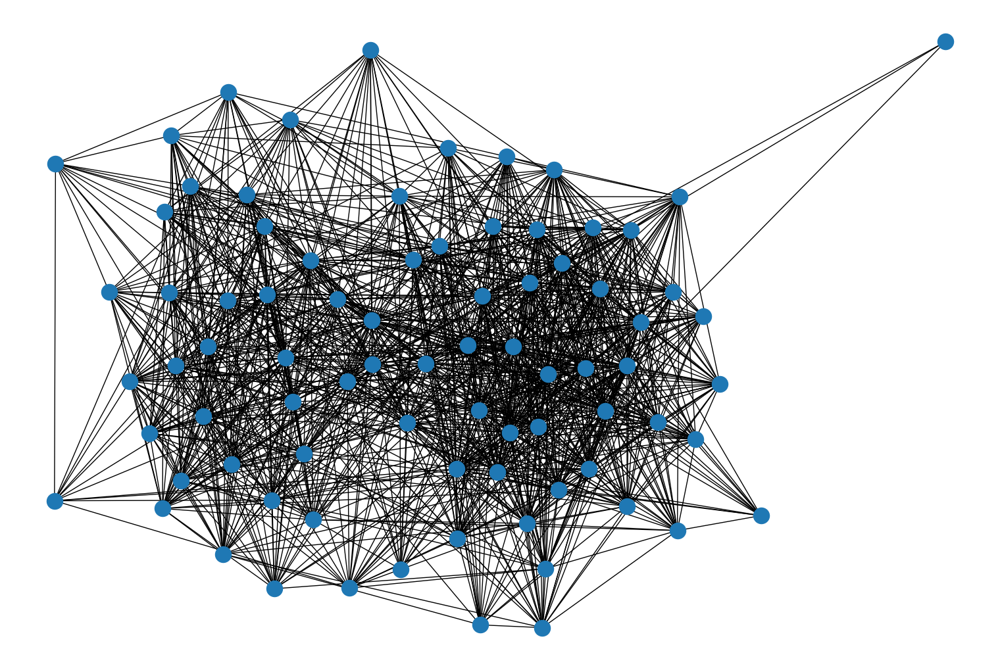

In [26]:
## Quick plot
nx.draw(G2)
print(nx.info(G2))

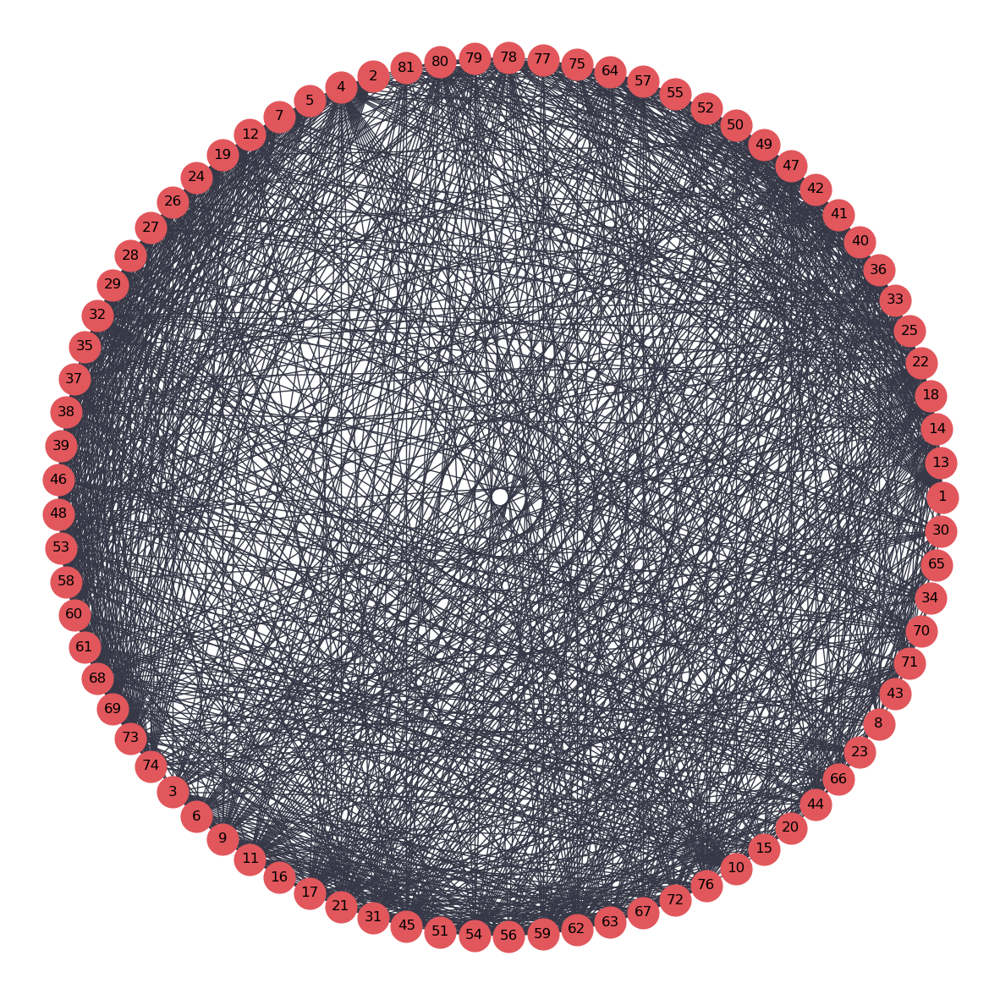

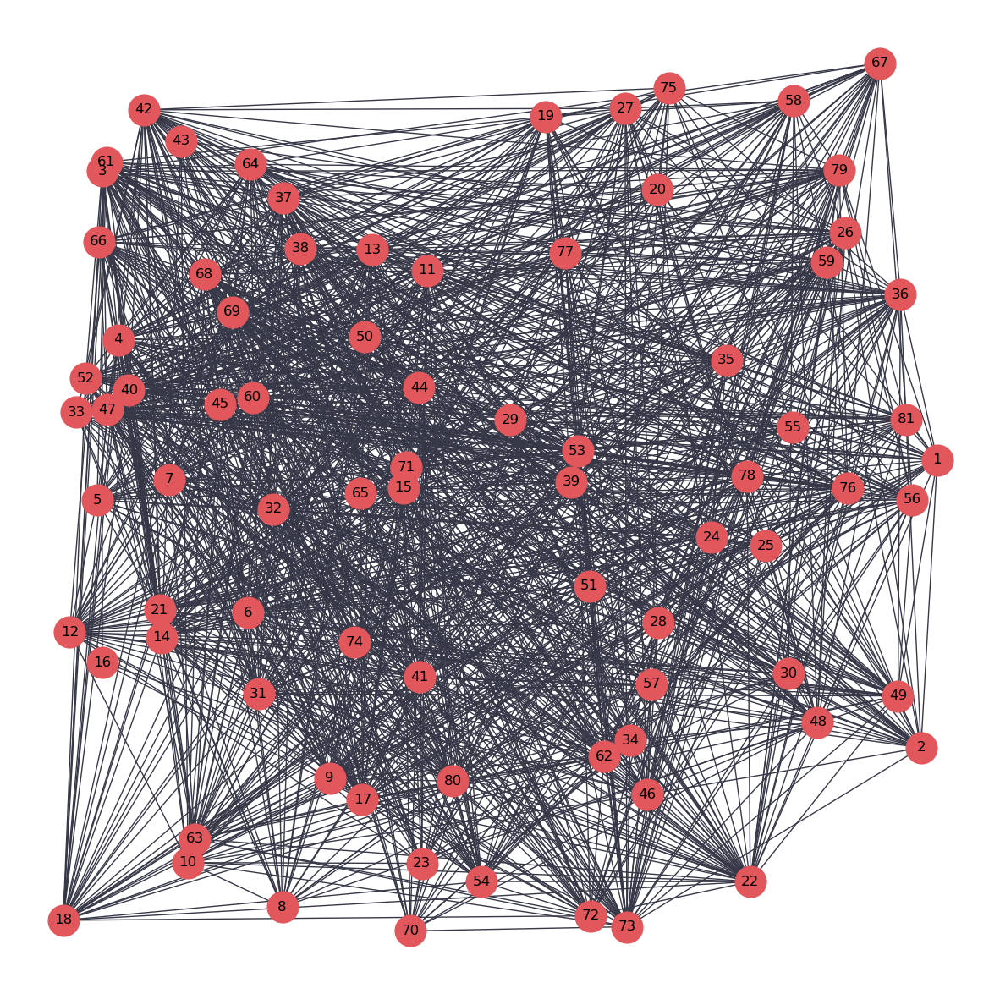

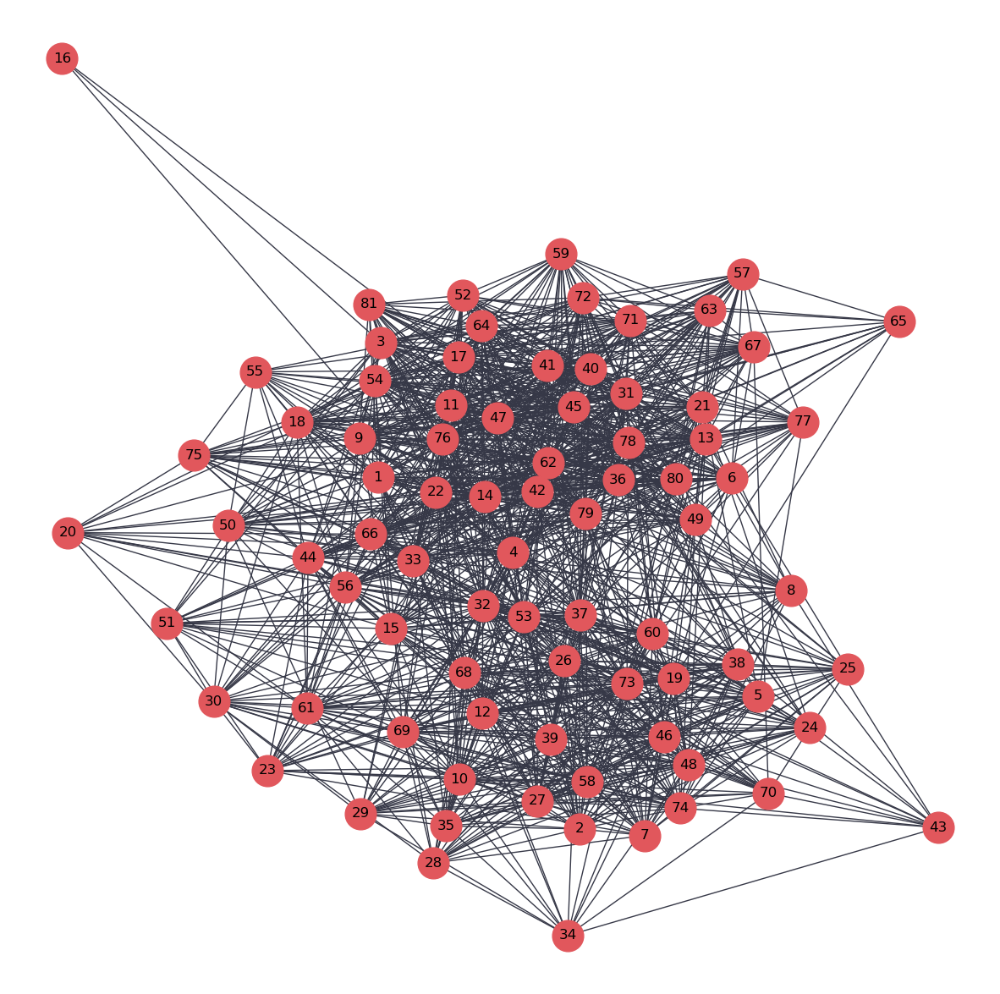

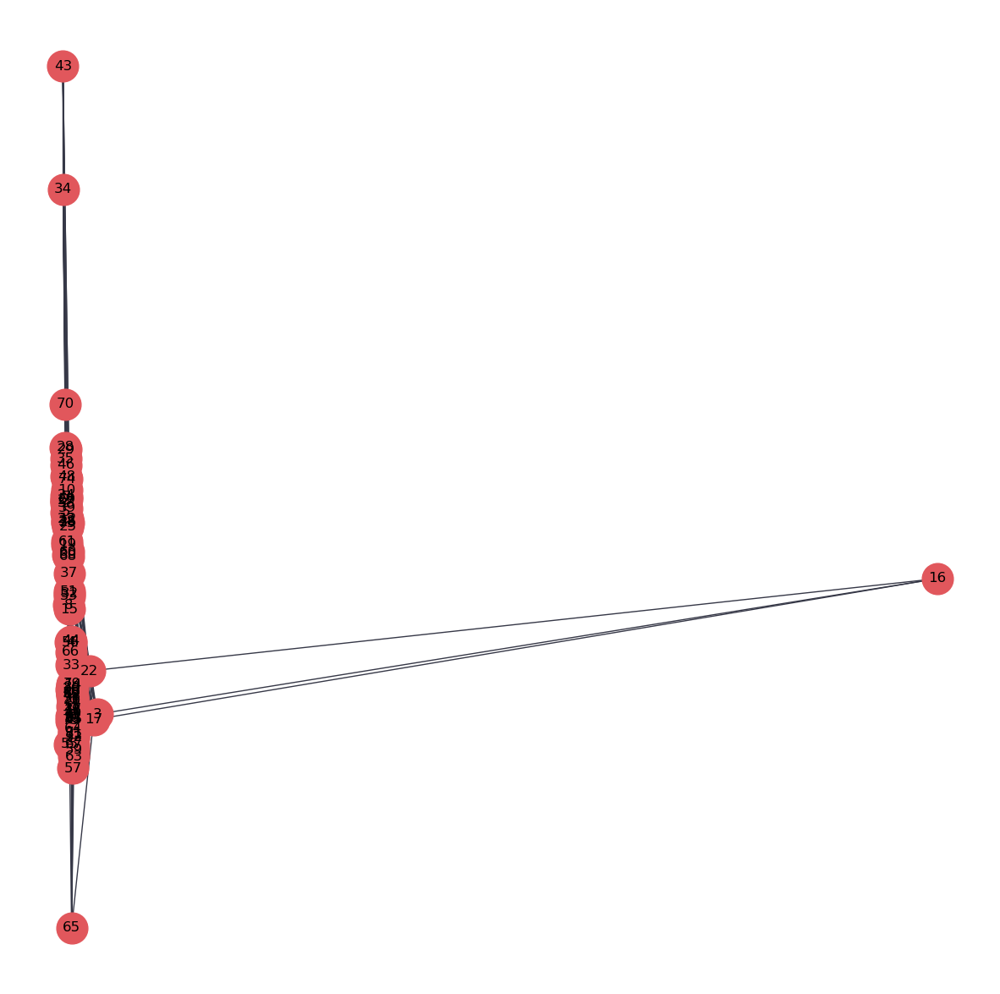

In [27]:
## Imporving the graph by trying out different layouts
graph_layouts = [nx.circular_layout(G2), nx.random_layout(G2), nx.spring_layout(G2), nx.spectral_layout(G2)]

for graph in graph_layouts:
        plt.subplots(figsize=(15, 15))
        nx.draw(G2, with_labels = True, node_size = 700, node_color = "#e1575c", edge_color = '#363847',  pos = graph)
        plt.show()

In [28]:
## Computing weighted eigenvector centrality
centrality_nx = nx.eigenvector_centrality(G2)
l_eigen_cent = list(centrality_nx.values())

## Finding the student node in graph who has the largest cenrtality value (most emails sent)
(largest_hub, degree) = sorted(centrality_nx, key = centrality_nx.get, reverse = True)[:2]
print(largest_hub)

df_eig_cent = pd.DataFrame(centrality_nx.items(), columns = ['person', 'degree_centrality'])
df_eig_cent.sort_values('degree_centrality', ascending = False).head()

22


,person,degree_centrality
4,22,0.174440
35,32,0.168062
63,62,0.167433
11,47,0.158991
55,17,0.153435


In [29]:
## Degree Centrality
## The function degree_centrality(G) is available in networkx.algorithms.centrality
deg_cent = nx.algorithms.centrality.degree_centrality(G2)
l_deg_cent = list(deg_cent.values())

## The output is dictionary of nodes with degree centrality as the value
print("Degree centrality:")
#print(deg_cent)

df_deg_cent = pd.DataFrame(deg_cent.items(), columns = ['person', 'degree_centrality'])
df_deg_cent.sort_values('degree_centrality', ascending = False).head()

Degree centrality:


,person,degree_centrality
35,32,0.7000
4,22,0.6500
63,62,0.6000
37,37,0.5875
42,53,0.5750


In [30]:
## The function betweenness_centrality(G) is also available in networkx.algorithms.centrality
bet_cent = nx.algorithms.centrality.betweenness_centrality(G2)
l_bet_cent = list(bet_cent.values())

print("Betweenness centrality:")
#print(bet_cent)

df_bet_cent = pd.DataFrame(bet_cent.items(), columns = ['person', 'betweeness_centrality'])
df_bet_cent.sort_values('betweeness_centrality', ascending = False).head()

Betweenness centrality:


,person,betweeness_centrality
35,32,0.032908
4,22,0.032547
42,53,0.020536
48,73,0.019304
37,37,0.019059


In [31]:
## The function betweenness_centrality(G) is also available in networkx.algorithms.centrality
clo_cent = nx.algorithms.centrality.closeness_centrality(G2)
l_clo_cent = list(clo_cent.values())

print("Closeness centrality:")
#print(clo_cent)

df_clo_cent = pd.DataFrame(clo_cent.items(), columns = ['person', 'closeness_centrality'])
df_clo_cent.sort_values('closeness_centrality', ascending = False).head()

Closeness centrality:


,person,closeness_centrality
35,32,0.769231
4,22,0.740741
63,62,0.714286
37,37,0.707965
42,53,0.701754


Text(0.5, 1.0, 'Betweenness Centrality')

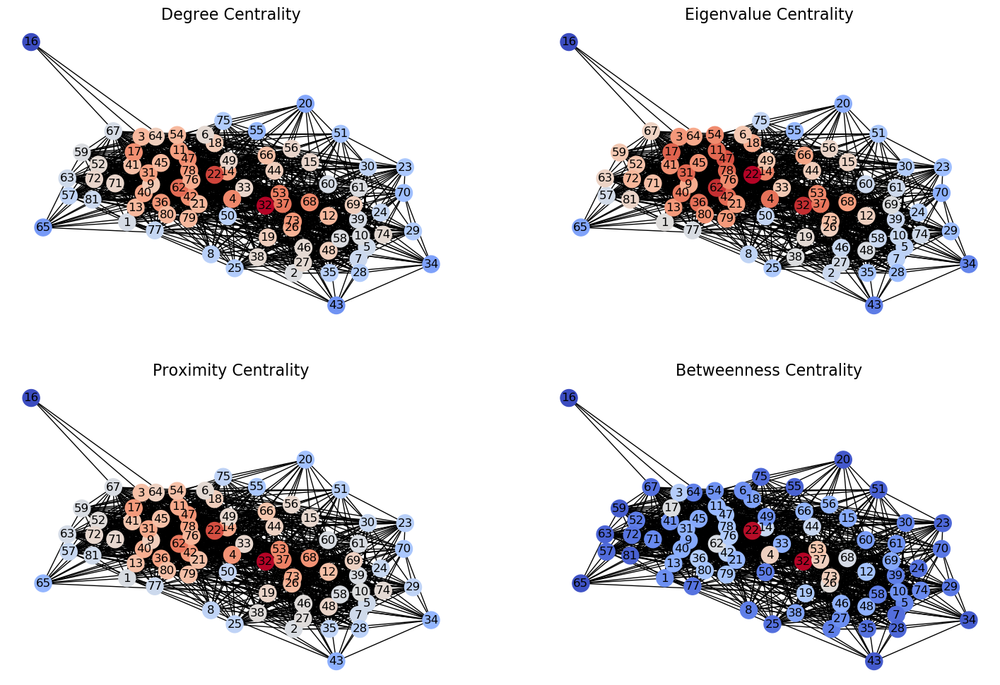

In [32]:
pos = nx.spring_layout(G2)

## Plotting all centrality measures 
# Plot the centrality of the nodes
plt.figure(figsize = (18, 12))
# Degree Centrality
f, axarr = plt.subplots(2, 2, num = 1)
plt.sca(axarr[0, 0])
nx.draw(G2, cmap = plt.get_cmap('coolwarm'), node_color = l_deg_cent, node_size = 300, pos = pos, with_labels=True)
axarr[0,0].set_title('Degree Centrality', size = 16)
# Eigenvalue Centrality
plt.sca(axarr[0,1])
nx.draw(G2, cmap = plt.get_cmap('coolwarm'), node_color = l_eigen_cent, node_size=300, pos=pos, with_labels=True)
axarr[0,1].set_title('Eigenvalue Centrality', size=16)
# Proximity Centrality
plt.sca(axarr[1,0])
nx.draw(G2, cmap = plt.get_cmap('coolwarm'), node_color = l_clo_cent, node_size=300, pos=pos, with_labels=True)
axarr[1,0].set_title('Proximity Centrality', size=16)
# Betweenness Centrality
plt.sca(axarr[1,1])
nx.draw(G2, cmap = plt.get_cmap('coolwarm'), node_color = l_bet_cent, node_size=300, pos=pos, with_labels=True)
axarr[1,1].set_title('Betweenness Centrality', size=16)

### WTTW: Girvan–Newman
The Girvan–Newman algorithm detects communities by progressively removing edges from the original network. The connected components of the remaining network are the communities. Instead of trying to construct a measure that tells us which edges are the most central to communities, the Girvan–Newman algorithm focuses on edges that are most likely "between" communities.

In [33]:
## Community detection: communities in a graph using the Girvan–Newman method
import itertools
from networkx.algorithms import community
communities_generator = community.girvan_newman(G2)

communities = next(communities_generator)
print(f'Using the Girvan-Method, the graph is split up into {len(communities)} communities')

Using the Girvan-Method, the graph is split up into 2 communities


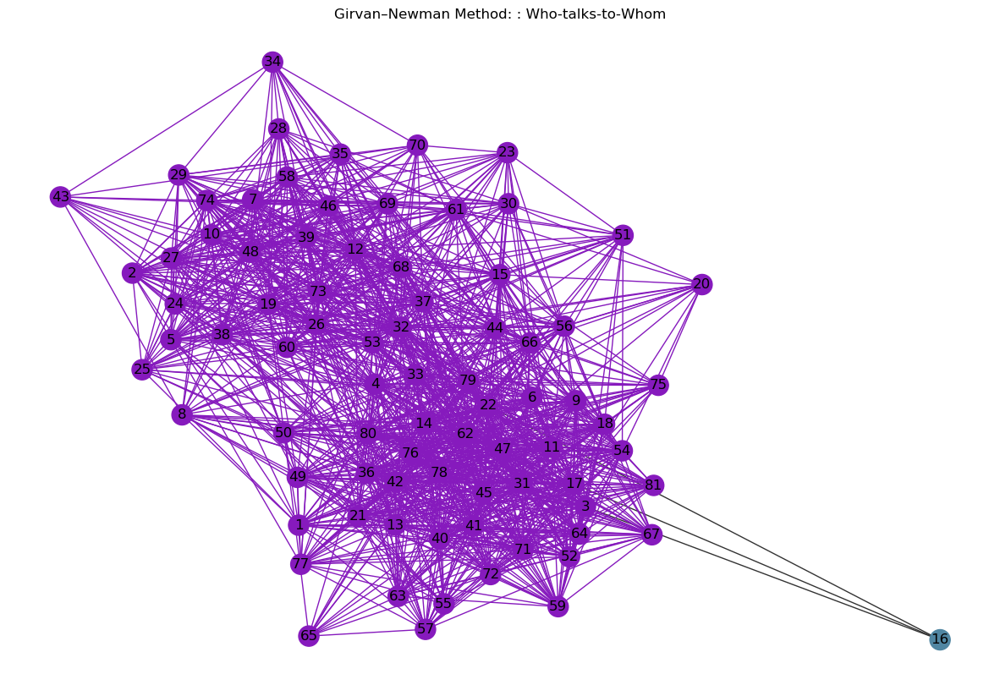

In [34]:
## Plotting 2 communities determined by the Girvan-Newman method
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams.update({'figure.figsize': (15, 10)})
# Set node and edge communities
set_node_community(G2, communities)
set_edge_community(G2)

# Set community color for nodes
node_color = [get_color(G2.nodes[v]['community']) for v in G2.nodes]

# Set community color for internal edges
external = [(v, w) for v, w in G2.edges if G2.edges[v, w]['community'] == 0]
internal = [(v, w) for v, w in G2.edges if G2.edges[v, w]['community'] > 0]
internal_color = [get_color(G2.edges[e]['community']) for e in internal]

wttw_pos = nx.spring_layout(G2)

plt.axis('off')
plt.title('Girvan–Newman Method: : Who-talks-to-Whom')
# Draw external edges
nx.draw_networkx(
    G2, pos=wttw_pos, node_size=0,
    edgelist=external, edge_color="#333333", with_labels=False)
# Draw nodes and internal edges
nx.draw_networkx(
    G2, pos=wttw_pos, node_color=node_color,
    edgelist=internal, edge_color=internal_color)

### WTTW: Louvain Modularity
The inspiration for this method of community detection is the optimization of modularity as the algorithm progresses. Modularity is a scale value between -1 and 1 that measures the density of edges inside communities to edges outside communities (how well groups have been partitioned into clusters). Optimizing this value theoretically results in the best possible grouping of the nodes of a given network, however going through all possible iterations of the nodes into groups is impractical so heuristic algorithms are used.

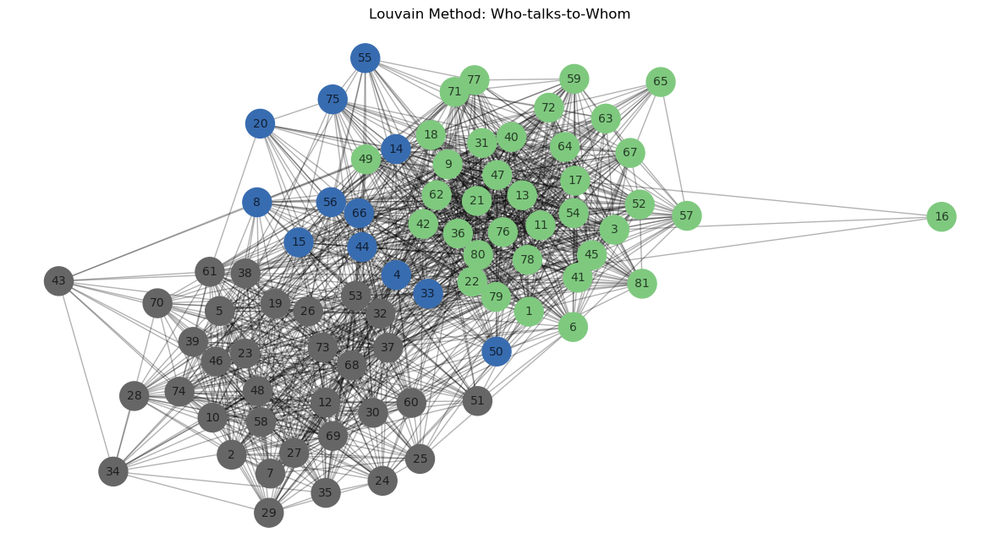

In [35]:
## Compute the first partition using Louvain modularity through the commuity package
from community import community_louvain
partition = community_louvain.best_partition(G2)

## Create graph based on partition
pos = nx.spring_layout(G2)
plt.figure(figsize = (15, 8))
plt.axis('off')
plt.title('Louvain Method: Who-talks-to-Whom')
nx.draw_networkx_nodes(G2, pos, with_label = True, node_size = 600, cmap = plt.cm.Accent, node_color = list(partition.values()))
nx.draw_networkx_edges(G2, pos, alpha = 0.3, with_labels = False)
nx.draw_networkx_labels(G2, pos, alpha = 0.7, font_size = 10)
plt.show(G2)

In [36]:
## Modularity of graph
mod = community_louvain.modularity(partition ,G2)
print("modularity:", mod)

modularity: 0.27613983585034224


### Conclusion
The Girvan-Newman and the Louvian methods, for both networks, return different communities in each network. This is because, both use their unique algorithm to find the splits. Both these networks are very small in size, especially when compared to the vast social networks Facebook and Twitter have. Even then, the algorithms are able to differentiate densely packed areas of each network.

It would be extremely interesting to run a community detection algorithms on Facebooks network but of course, we can't, because we are not Facebook and they won't willingly give us that data. The study of social networks, thus, is still relatively limited. These massive networks are proprietary to their parent company and not open-source.

### Further Reading
#### Community Detection
https://en.wikipedia.org/wiki/Community_structure

#### Modularity 
https://en.wikipedia.org/wiki/Modularity_(networks)

#### Girvan-Newman
https://en.wikipedia.org/wiki/Girvan%E2%80%93Newman_algorithm

#### Louvian Modularity
https://en.wikipedia.org/wiki/Louvain_modularity